In [1]:
%matplotlib notebook

In [3]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import random
import cv2

plt.style.use('seaborn-pastel')

from IPython.display import Image
from IPython.display import HTML

tf.enable_eager_execution()

tf.__version__

'1.14.0'

In [4]:
def dense(size, activation):
    return tf.keras.layers.Dense(
        size,
        activation=activation,
        kernel_initializer=tf.random_normal_initializer(0, 1),
        bias_initializer=tf.random_normal_initializer(0, 1)
    )

class FFN:
    def __init__(self, width, depth, out_size=1):
        self.layers = []
        for i in range(depth):
            self.layers.append(dense(
                width, tf.sigmoid if i == 0 else tf.tanh
            ))

        # map to pixels
        self.layers.append(dense(out_size, tf.sigmoid))

    def generate_input_mesh(self, size):
        w, h = size
        ar = w / h
        x = np.linspace(0, ar, w)
        y = np.linspace(0, 1, h)
        xx, yy = np.meshgrid(x, y)
        mesh = np.stack((xx.reshape(-1), yy.reshape(-1)), axis=-1)

        return mesh

    def generate(self, z, im_size=(128, 128)):
        mesh = self.generate_input_mesh(im_size)
        # Add z to input
        result = np.concatenate((np.tile(z, (mesh.shape[0], 1)), mesh), axis=-1)

        for d in self.layers:
            result = d(result)

        img = result.numpy().reshape(*im_size[::-1], -1)
        return img if img.shape[-1] != 1 else img[:,:,0]

In [7]:
def make_sampler(ppn_ctor, cols, rows):
    # Save the networks
    cppns = []
    for r in range(rows):
        cppns.append([])
        for c in range(cols):
            cppns[-1].append(ppn_ctor())

    # Sample from the networks
    def sampler(z, w, h):
        rows_of_images = []
        for r in range(rows):
            row_of_images = []
            for c in range(cols):
                img = cppns[r][c].generate(z, im_size=(w // cols, h // rows))
                row_of_images.append(img)

            row = np.concatenate(row_of_images, axis=1)
            rows_of_images.append(row)

        return np.concatenate(rows_of_images, axis=0)

    return sampler

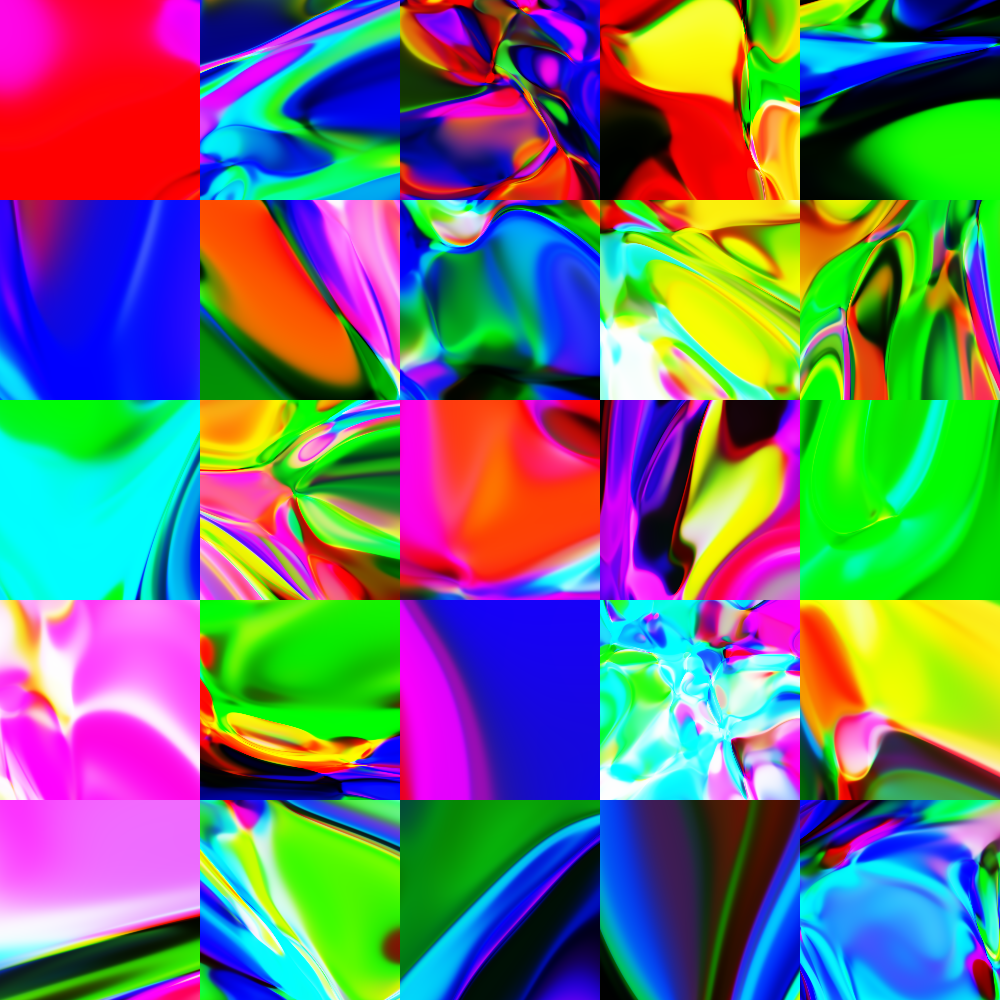

In [8]:
imgs = make_sampler(lambda: FFN(25, 9, 3), 5, 5)(z=1, w=1000, h=1000)
plt.imsave('test.png', imgs, format='png', cmap='Greys')
Image(filename='test.png')

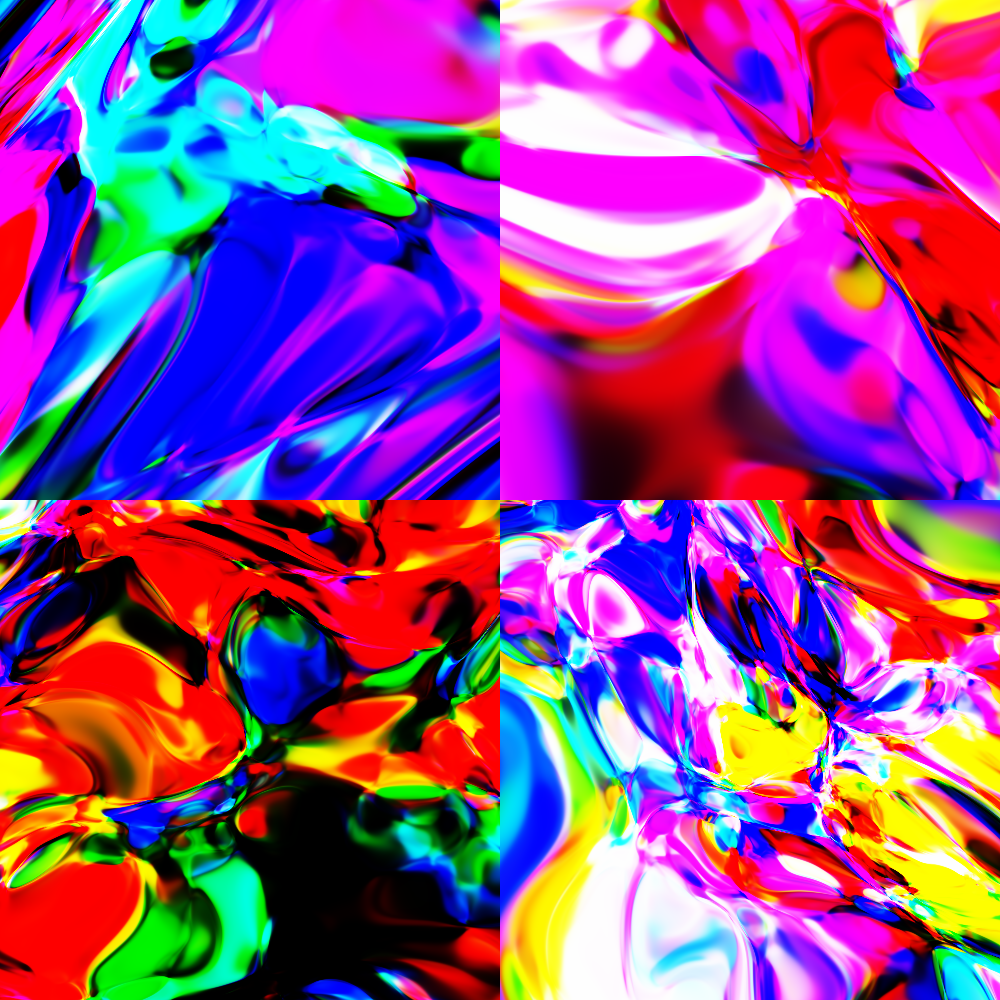

In [1820]:
imgs = make_sampler(lambda: FFN(50, 9, 3), 2, 2)(z=1, w=1000, h=1000)
plt.imsave('test.png', imgs, format='png', cmap='Greys')
Image(filename='test.png')

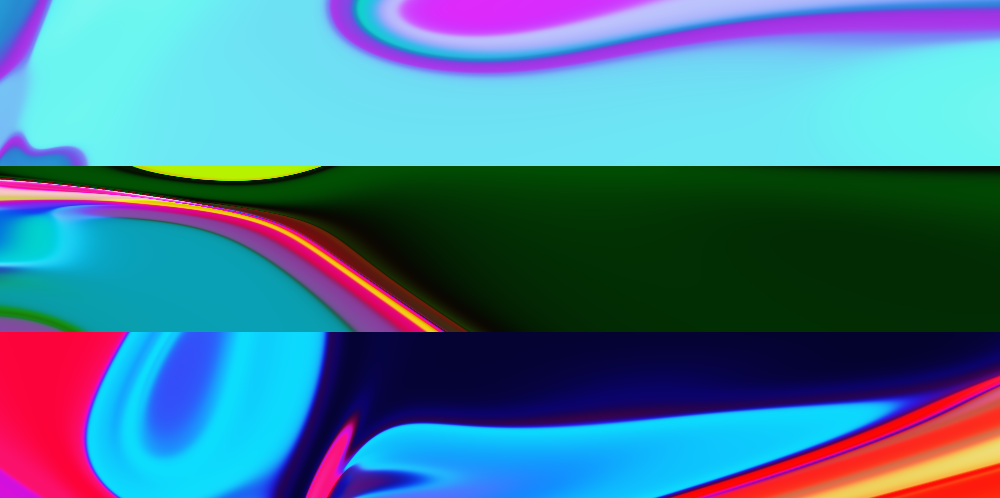

In [1864]:
imgs = make_sampler(lambda: FFN(12, 15, 3), 1, 3)(z=1, w=1000, h=500)
plt.imsave('test.png', imgs, format='png', cmap='Greys')
Image(filename='test.png')

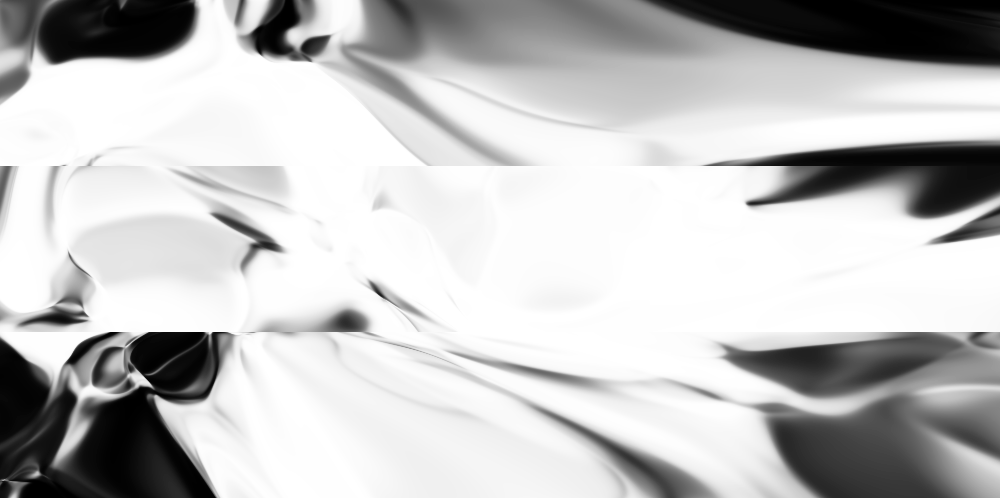

In [1875]:
imgs = make_sampler(lambda: FFN(30, 8, 1), 1, 3)(z=1, w=1000, h=500)
plt.imsave('test.png', imgs, format='png', cmap='Greys')
Image(filename='test.png')

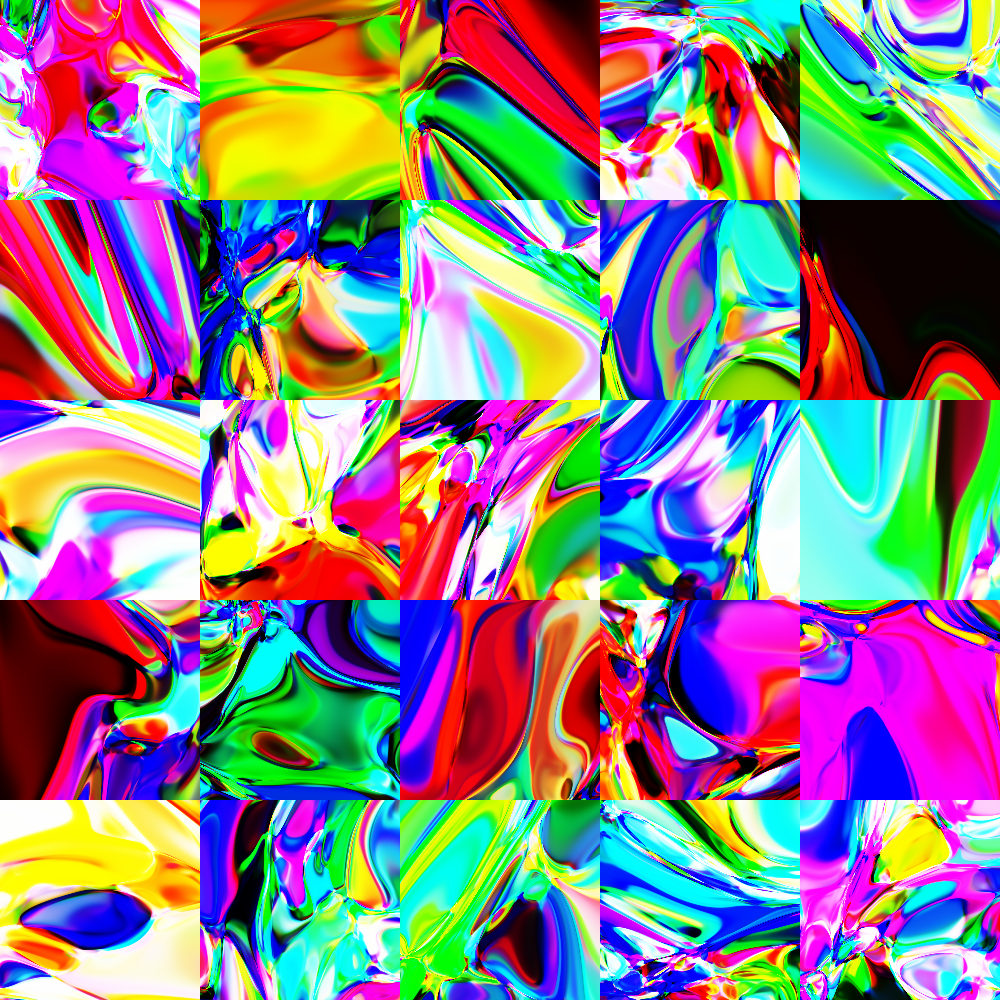

In [1916]:
imgs = make_sampler(lambda: FFN(30, 11, 3), 5, 5)(z=1, w=1000, h=1000)
plt.imsave('test.png', imgs, format='png', cmap='Greys')
Image(filename='test.png')

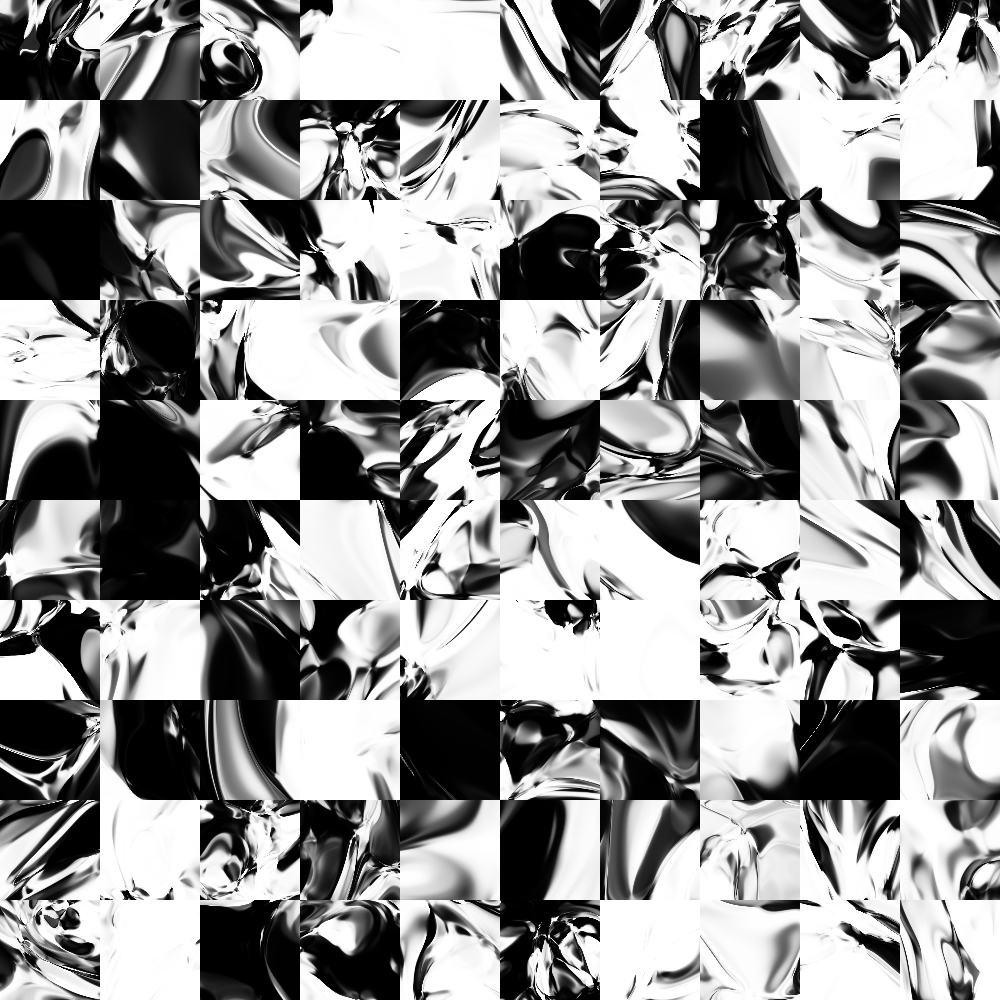

In [1918]:
imgs = make_sampler(lambda: FFN(30, 9, 1), 10, 10)(z=1, w=1000, h=1000)
plt.imsave('test.png', imgs, format='png', cmap='Greys')
Image(filename='test.png')

In [149]:
def make_anim(ppn_ctor, cols, rows, duration=5, W=1000, H=1000):
    sampler = make_sampler(ppn_ctor, cols, rows)
    z_start = np.random.normal(0, 1, size=32)
    z_end = np.random.normal(0, 1, size=32)

    img = sampler(z_start, W, H)

    fig, ax = plt.subplots()
    ax.axis('off')

    l = ax.imshow(img, cmap='Greys', aspect='auto')
    plt.tight_layout()
    fig.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=None, hspace=None)
    fig.set_size_inches(6, 6, forward=True)

    frames = 30 * duration # 30fps

    def animate(i):
        global z_start, z_end, frames
        lerp = np.sin(i / frames * np.pi)
        z = z_start * lerp + z_end * (1 - lerp)
        img = sampler(z, W, H)
        l.set_data(img)

    ani = FuncAnimation(fig, animate, frames=frames)

    return ani

<IPython.core.display.Javascript object>


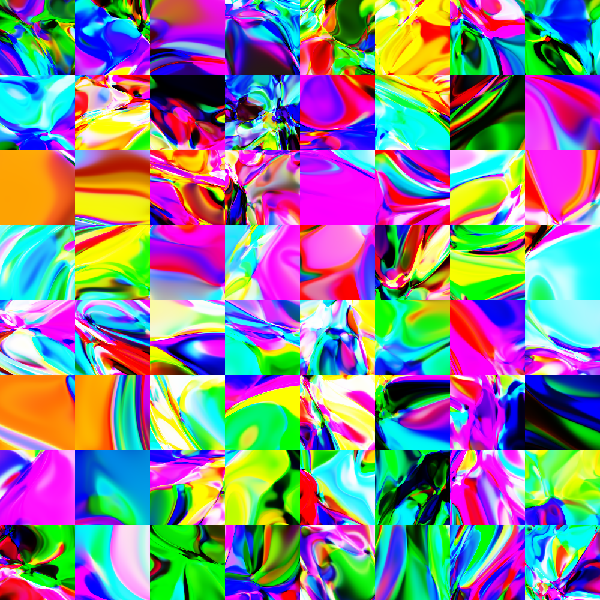

In [154]:
ani = make_anim(lambda: FFN(30, 9, 3), cols=8, rows=8, W=1000, H=1000, duration=5)

In [155]:
ani.save('anim.gif', writer='pillow', fps=30, bitrate=-1)

<IPython.core.display.Javascript object>


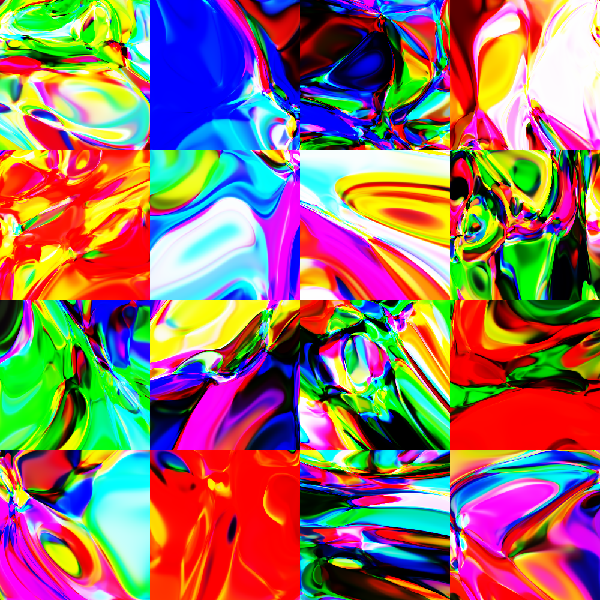

In [152]:
ani2 = make_anim(lambda: FFN(35, 10, 3), cols=4, rows=4, W=1000, H=1000, duration=5)

In [153]:
ani2.save('anim2.gif', writer='pillow', fps=30, bitrate=-1)

In [168]:
class FFNPic:
    def __init__(self, width, depth, img_path):
        self.img_path = img_path
        self.layers = []
        for i in range(depth):
            self.layers.append(dense(
                width, tf.sigmoid if i == 0 else tf.tanh
            ))

        # map to pixels
        self.layers.append(dense(3, tf.sigmoid))

    def generate_discrete_space(self, w, h):
        ar = w / h 
        x = np.linspace(0, ar, w)
        y = np.linspace(0, 1, h)
        xx, yy = np.meshgrid(x, y)
        mesh = np.stack((xx.reshape(-1), yy.reshape(-1)), axis=-1)

        return mesh

    def generate(self, z, im_size=None):
        im = cv2.imread(self.img_path)
        im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
        if im_size is not None:
            im = cv2.resize(im, im_size)
        
        w, h, c = im.shape
        im = im.reshape(-1, 3) / np.max(im)
        
        mesh = self.generate_discrete_space(w, h)
        # Add z to input
        result = np.concatenate((im, np.tile(z, (mesh.shape[0], 1)), mesh), axis=-1)

        for d in self.layers:
            result = d(result)

        img = result.numpy().reshape(h, w, -1)
        return img

In [169]:
cv2.resize(out, (10, 10)).shape

(10, 10, 3)

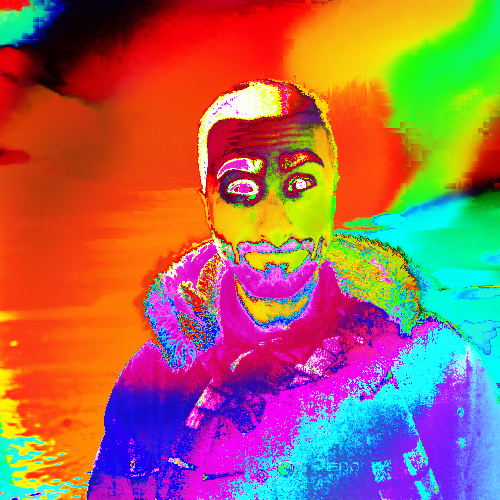

In [173]:
ffn = FFNPic(30, 8, 'avatar.jpg')
out = ffn.generate([0, 0, 0], (500, 500))

plt.imsave('test.png', out, format='png')
Image(filename='test.png')

<IPython.core.display.Javascript object>


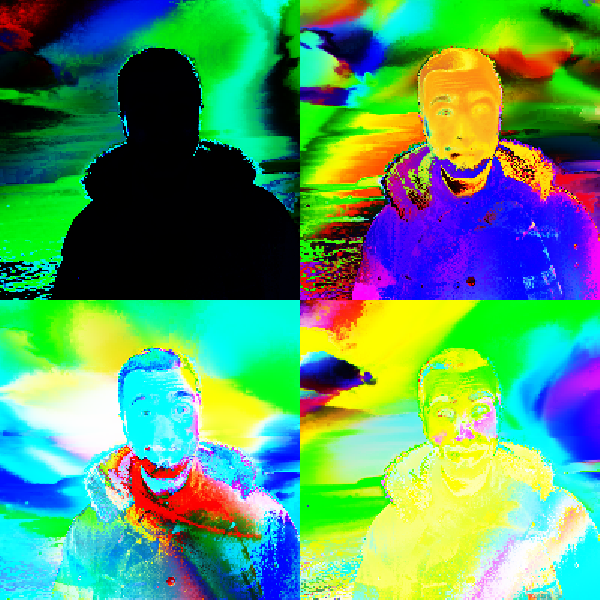

In [197]:
ani2 = make_anim(lambda: FFNPic(50, 6, 'avatar.jpg'), cols=2, rows=2, W=400, H=400, duration=5)

In [198]:
ani2.save('avatar_anim.gif', writer='pillow', fps=30, bitrate=-1)

<IPython.core.display.Javascript object>


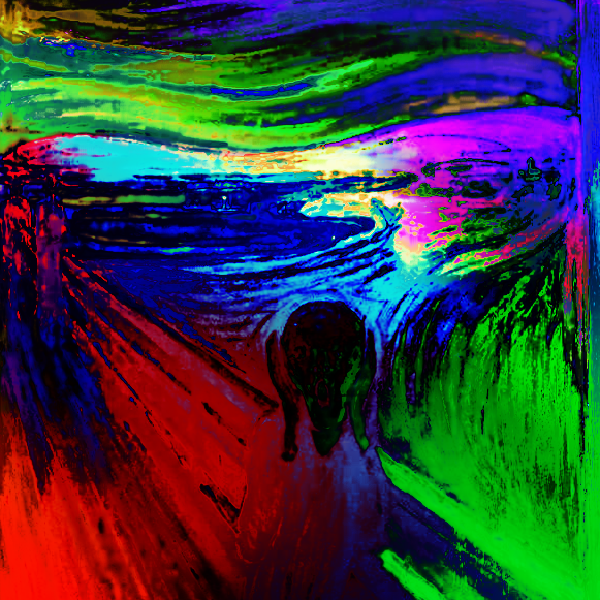

In [264]:
scream = make_anim(lambda: FFNPic(30, 6, 'scream.png'), cols=1, rows=1, W=581, H=581, duration=5)

In [265]:
scream.save('scream_anim.gif', writer='pillow', fps=30, bitrate=-1)

<IPython.core.display.Javascript object>


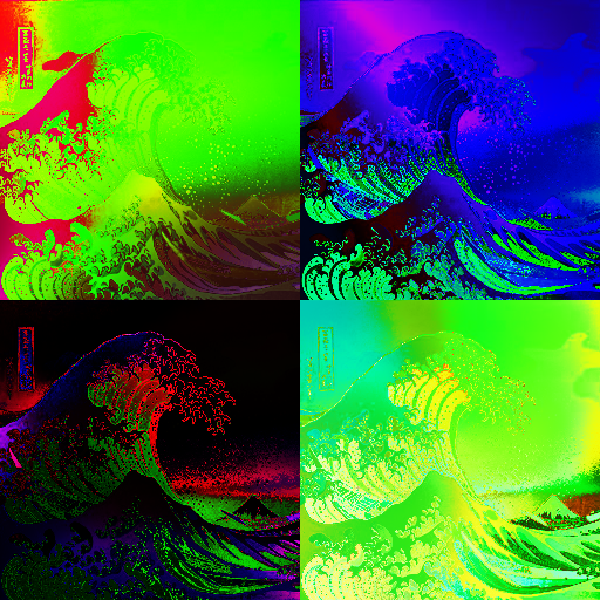

In [304]:
kanagawa = make_anim(lambda: FFNPic(30, 5, 'kanagawa.jpg'), cols=2, rows=2, W=512, H=512, duration=5)

In [305]:
kanagawa.save('kanagawa_anim.gif', writer='pillow', fps=30, bitrate=-1)

<IPython.core.display.Javascript object>


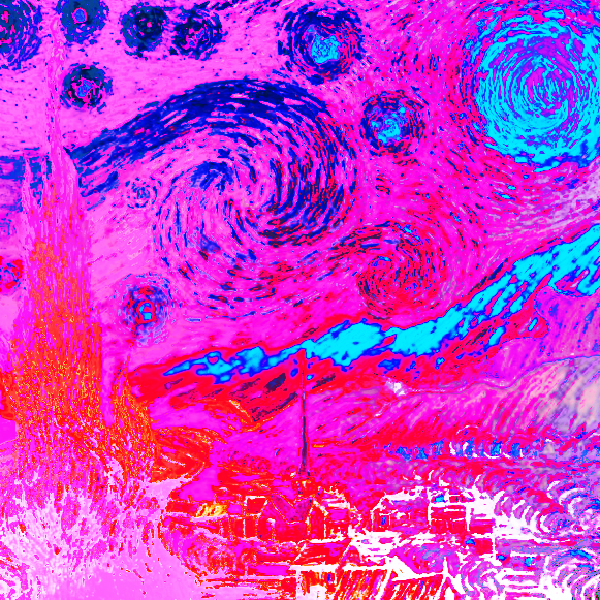

In [323]:
starry_night = make_anim(lambda: FFNPic(25, 6, 'starry_night.jpg'), cols=1, rows=1, W=581, H=581, duration=5)

In [ ]:
starry_night.save('starry_night_anim.gif', writer='pillow', fps=30, bitrate=-1)